In [1]:
# https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

In [2]:
# Set random seem for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [3]:
# Root directory for dataset
dataroot = "../../data/celeba"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this size using a transformer.
image_size = 64

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [4]:
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

dataset = datasets.ImageFolder(
    root=dataroot,
    transform=transform
)

dataloader = torch.utils.data.DataLoader(
    dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=workers
)

In [5]:
next(iter(dataloader))

[tensor([[[[ 0.8745,  0.8745,  0.8745,  ...,  0.8275,  0.8275,  0.8275],
           [ 0.8745,  0.8745,  0.8745,  ...,  0.8275,  0.8275,  0.8275],
           [ 0.8824,  0.8824,  0.8824,  ...,  0.8275,  0.8275,  0.8196],
           ...,
           [-0.7725, -0.7804, -0.7882,  ...,  0.3333,  0.6235,  0.8196],
           [-0.7647, -0.7725, -0.7961,  ...,  0.3569,  0.3804,  0.6392],
           [-0.7647, -0.7804, -0.8118,  ..., -0.0510, -0.0118,  0.1843]],
 
          [[ 0.8667,  0.8667,  0.8667,  ...,  0.8196,  0.8196,  0.8196],
           [ 0.8667,  0.8667,  0.8667,  ...,  0.8196,  0.8196,  0.8196],
           [ 0.8745,  0.8745,  0.8745,  ...,  0.8196,  0.8196,  0.8118],
           ...,
           [-0.7647, -0.7725, -0.7804,  ...,  0.2314,  0.5843,  0.8275],
           [-0.7569, -0.7647, -0.7882,  ...,  0.1451,  0.2706,  0.6157],
           [-0.7569, -0.7725, -0.8039,  ..., -0.3098, -0.1843,  0.0667]],
 
          [[ 0.9137,  0.9137,  0.9137,  ...,  0.8588,  0.8588,  0.8588],
           [ 

In [7]:
# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")
display(device)

device(type='cuda', index=0)

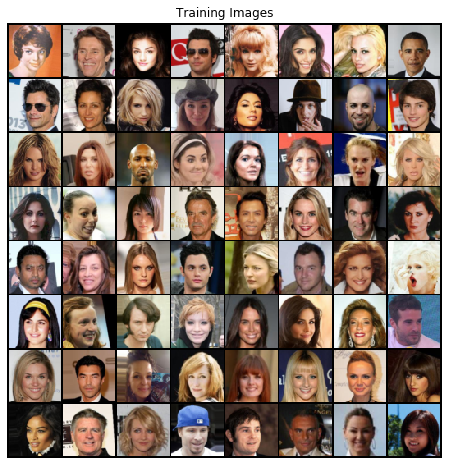

In [8]:
# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [9]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [10]:
# Generator Code

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# torch.nn.ConvTranspose2d(
#     in_channels, out_channels, kernel_size, stride=1, padding=0, 
#     output_padding=0, groups=1, bias=True, dilation=1, padding_mode='zeros')
#  Hout =(Hin − 1) × stride[0] − 2 × padding[0] + dilation[0] × (kernel_size[0] − 1) + output_padding[0] + 1
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            # 1 -> 4 == (1 - 1) * 1 - 2 * 0 + 1 * (4 - 1) + 0 + 1
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [11]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [12]:
# Number of channels in the training images. For color images this is 3
nc = 3

# Size of feature maps in discriminator
ndf = 64

# torch.nn.Conv2d(
#     in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, 
#     groups=1, bias=True, padding_mode='zeros')

class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [14]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [19]:
# Loss function

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize the progression of the generator
# Input for Generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [1]:
def train_discriminator(x, y):
        # Forward pass real batch through D
        output = netD(x).view(-1)
        # Calculate loss on all-real batch
        error = criterion(output, y)
        
        return error, output.mean().item()

In [27]:
# Training Loop

# Number of training epochs
num_epochs = 5

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        
        netD.zero_grad()
        errD_real, D_x = train_discriminator(real_cpu, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        
        # training discriminator using fake image from generator
        # deatch fake image tensor to prevent backprop to generator
        errD_fake, D_G_z1 = train_discriminator(fake.detach(), label)
        # Calculate gradients for D in backward pass
        errD_fake.backward()
        
        # Update D
        optimizerD.step()
        
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        
        
        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        label.fill_(real_label)  # fake labels are real for generator cost
        
        netG.zero_grad()
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        
        optimizerG.step()
        
        D_G_z2 = output.mean().item()
        # Update G
        
        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/5][0/1583]	Loss_D: 1.6760	Loss_G: 6.2789	D(x): 0.7453	D(G(z)): 0.6687 / 0.0031
[0/5][50/1583]	Loss_D: 0.5132	Loss_G: 11.5194	D(x): 0.9437	D(G(z)): 0.2737 / 0.0000
[0/5][100/1583]	Loss_D: 0.5508	Loss_G: 11.5716	D(x): 0.8909	D(G(z)): 0.2510 / 0.0000
[0/5][150/1583]	Loss_D: 0.6201	Loss_G: 5.9294	D(x): 0.6822	D(G(z)): 0.0136 / 0.0070
[0/5][200/1583]	Loss_D: 2.0458	Loss_G: 8.0605	D(x): 0.9759	D(G(z)): 0.7406 / 0.0009
[0/5][250/1583]	Loss_D: 0.4815	Loss_G: 4.8078	D(x): 0.8898	D(G(z)): 0.2403 / 0.0147
[0/5][300/1583]	Loss_D: 0.6937	Loss_G: 2.5891	D(x): 0.6534	D(G(z)): 0.0851 / 0.1136
[0/5][350/1583]	Loss_D: 0.9176	Loss_G: 5.9237	D(x): 0.8725	D(G(z)): 0.4715 / 0.0062
[0/5][400/1583]	Loss_D: 0.3419	Loss_G: 4.4877	D(x): 0.8096	D(G(z)): 0.0639 / 0.0313
[0/5][450/1583]	Loss_D: 0.7202	Loss_G: 5.2969	D(x): 0.9055	D(G(z)): 0.3816 / 0.0147
[0/5][500/1583]	Loss_D: 0.2626	Loss_G: 3.4493	D(x): 0.9078	D(G(z)): 0.1206 / 0.0664
[0/5][550/1583]	Loss_D: 2.7401	Loss_G: 5.6935	D(x):

[3/5][50/1583]	Loss_D: 0.5653	Loss_G: 1.7206	D(x): 0.7032	D(G(z)): 0.1488 / 0.2127
[3/5][100/1583]	Loss_D: 0.8024	Loss_G: 1.9500	D(x): 0.6979	D(G(z)): 0.3018 / 0.1828
[3/5][150/1583]	Loss_D: 1.5457	Loss_G: 3.8161	D(x): 0.8972	D(G(z)): 0.6830 / 0.0710
[3/5][200/1583]	Loss_D: 0.6140	Loss_G: 1.1836	D(x): 0.7480	D(G(z)): 0.2293 / 0.3576
[3/5][250/1583]	Loss_D: 0.5808	Loss_G: 1.9604	D(x): 0.7553	D(G(z)): 0.2260 / 0.1746
[3/5][300/1583]	Loss_D: 0.7685	Loss_G: 3.7813	D(x): 0.8306	D(G(z)): 0.3902 / 0.0320
[3/5][350/1583]	Loss_D: 0.5811	Loss_G: 2.7535	D(x): 0.7364	D(G(z)): 0.1966 / 0.0929
[3/5][400/1583]	Loss_D: 0.6710	Loss_G: 3.3144	D(x): 0.8805	D(G(z)): 0.3796 / 0.0477
[3/5][450/1583]	Loss_D: 0.6855	Loss_G: 1.9842	D(x): 0.6425	D(G(z)): 0.1502 / 0.1832
[3/5][500/1583]	Loss_D: 1.2527	Loss_G: 3.1910	D(x): 0.7899	D(G(z)): 0.4975 / 0.0635
[3/5][550/1583]	Loss_D: 0.6375	Loss_G: 1.2615	D(x): 0.6383	D(G(z)): 0.1333 / 0.3277
[3/5][600/1583]	Loss_D: 0.7087	Loss_G: 3.2744	D(x): 0.8650	D(G(z)): 0.3932 / 

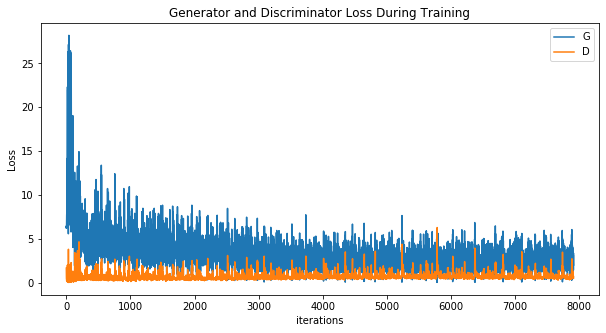

In [28]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

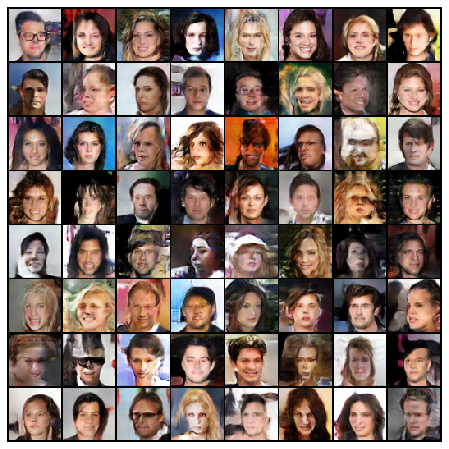

In [29]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())